<a href="https://colab.research.google.com/github/CourtneyBrookes/PinniWatch/blob/main/PinniWatchSlides.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [32]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
import wandb as wb

In [33]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device)

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=device)

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()

def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image, size=224):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    tensor = transform(image).unsqueeze(0).to(device)
    tensor.requires_grad = True
    return tensor



In [34]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

model = alexnet(weights='DEFAULT').to(device)
model.eval();

In [35]:
url = "https://docs.google.com/presentation/d/1BOMFpKkecm3TDqE56MWQ8DSH3EW7JMsulmim4nEyllw/edit#slide=id.g206f8279a60_0_0"

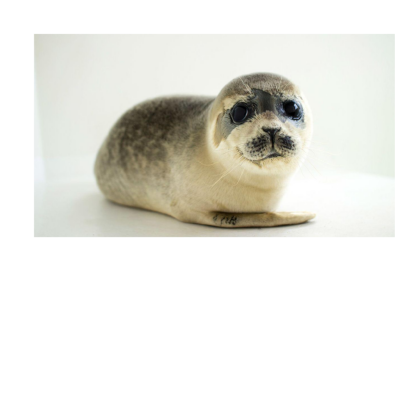

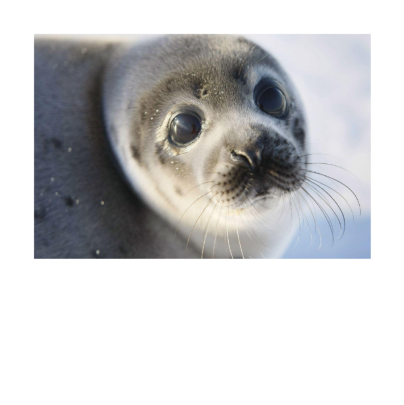

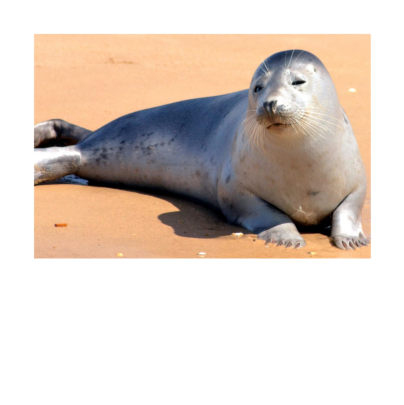

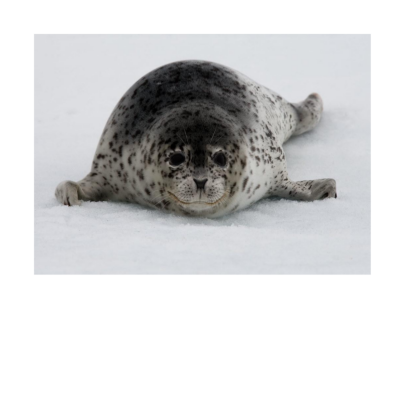

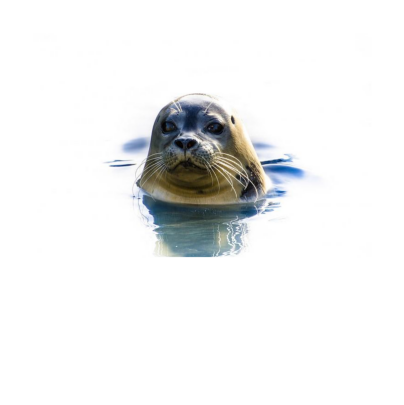

...

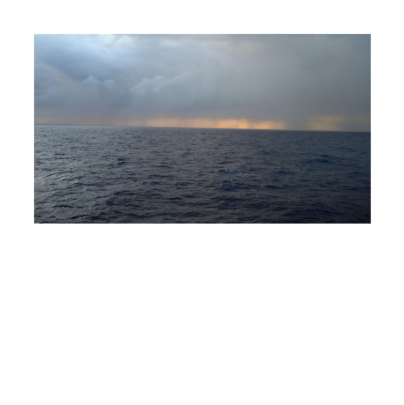

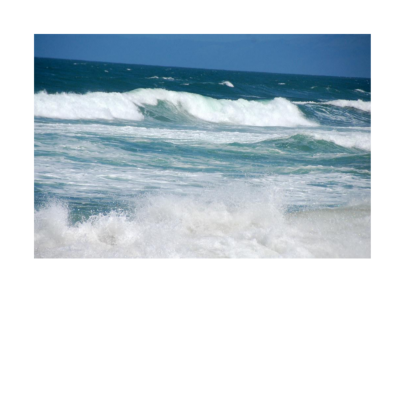

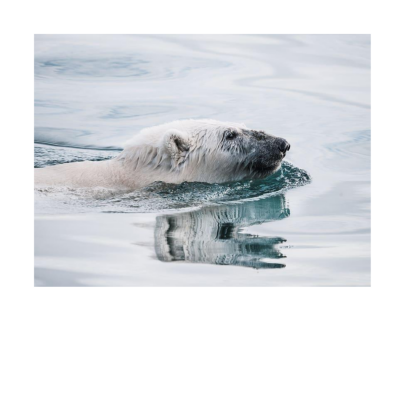

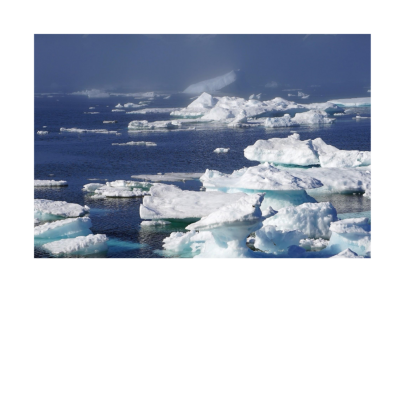

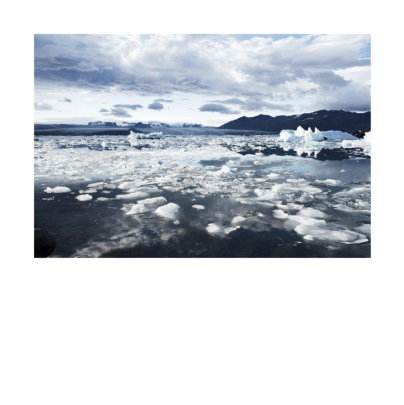

In [36]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

In [37]:
images.shape

torch.Size([100, 3, 224, 224])

In [38]:
model(images)

tensor([[-2.2589, -4.9977, -1.8099,  ..., -1.2031,  1.1717,  3.7228],
        [-2.1632, -1.8361,  0.0148,  ..., -2.1393,  1.2035,  3.4678],
        [-0.8471, -4.8171, -1.3843,  ..., -1.5346,  1.1044,  3.4264],
        ...,
        [-1.4176, -6.0191,  1.2795,  ..., -7.2773, -1.2780,  0.1042],
        [ 0.6967, -3.7366,  0.0825,  ..., -4.0471, -1.9947, -0.1614],
        [ 1.4290, -3.0520,  1.4511,  ..., -4.5730, -0.6464,  1.3170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [39]:
y = model(images)

In [40]:
y.shape

torch.Size([100, 1000])

In [41]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [42]:
for i in list(guesses):
    print(labels[i])

badger
black-footed ferret, ferret, Mustela nigripes
sea lion
toy poodle
quill, quill pen
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
sea lion
otter
snow leopard, ounce, Panthera uncia
American black bear, black bear, Ursus americanus, Euarctos americanus
seashore, coast, seacoast, sea-coast
badger
sea lion
otter
otter
ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus
sea lion
grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus
otter
pug, pug-dog
beaver
otter
otter
leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea
seashore, coast, seacoast, sea-coast
seashore, coast, seacoast, sea-coast
grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus
monitor
web site, website, internet site, site
television, television system
screen, CRT screen
web site, website, internet site, site
sleeping bag
monitor
sleeping bag
mo

In [43]:
# Y = np.zeros(50,)
# Y[25:] = 1

In [44]:
 Y = np.zeros(100,)
 Y[50:] = 1

In [45]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [46]:
X = y.detach().cpu().numpy()

In [47]:
X.shape

(100, 1000)

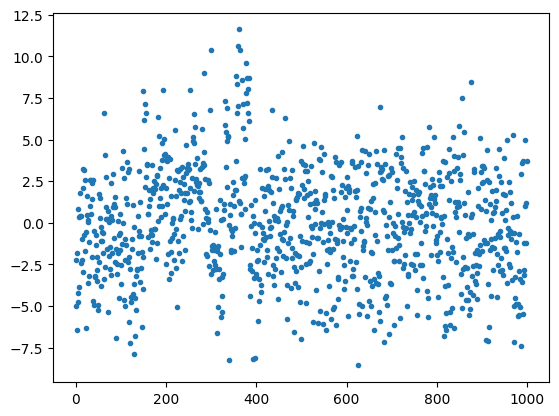

In [48]:
plt.plot(X[0],'.')

(array([ 17.,  75., 135., 220., 229., 201.,  80.,  26.,  12.,   5.]),
 array([-8.57296276, -6.55434942, -4.53573608, -2.51712251, -0.49850902,
         1.52010441,  3.53871775,  5.55733109,  7.5759449 ,  9.59455776,
        11.61317158]),
 <BarContainer object of 10 artists>)

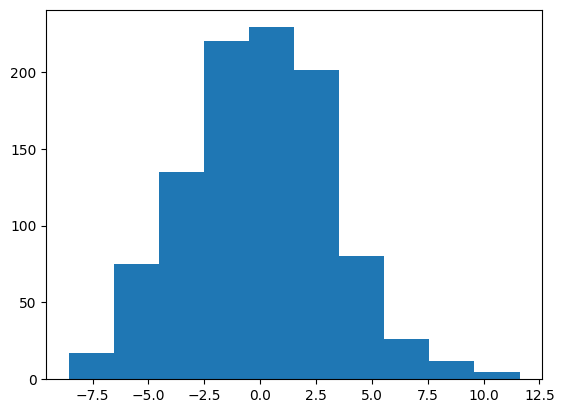

In [49]:
plt.hist(X[0])

In [50]:
X = GPU_data(X)
Y = GPU_data(Y)

In [51]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [52]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [53]:
def randn_trunc(s): #Truncated Normal Random Numbers
    mu = 0
    sigma = 0.1
    R = stats.truncnorm((-2*sigma - mu) / sigma, (2*sigma - mu) / sigma, loc=mu, scale=sigma)
    return R.rvs(s)

In [54]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [55]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [56]:
X.shape

torch.Size([100, 1000])

In [57]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [58]:
def model(x,w):

    return x@w[0]

In [59]:
def make_plots():

    acc_train = acc(model(x,w),y)

    # xt,yt = get_batch('test')

    # acc_test = acc(model(xt,w),yt)

    wb.log({"acc_train": acc_train})

In [31]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 8
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<ipython-input-2-13a1dae5b345>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device)
